# Pipeline

## Imports

In [1]:
# Suppression des avertissements liés à Scikit-learn
import warnings  # Masquer les avertissements (ex. : FutureWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Librairies générales
import pandas as pd  # Librairie pour la manipulation de données
import numpy as np  # Librairie pour le calcul numérique
import sys  # Fonctions et variables liées à l'interpréteur Python
import copy  # Création de copies d'objets
from numpy import mean, std  # Fonctions de calcul de moyenne et d'écart type
import zipfile  # Traitement de fichiers zip
import os  # Manipulation de fichiers et chemins

# Librairie affichage
import matplotlib.pyplot as plt  # Outils de visualisation 2D
from matplotlib import pyplot  # Interface de la bibliothèque Matplotlib
import seaborn as sns  # Bibliothèque de visualisation de données basée sur Matplotlib

# Scikit-learn pour l'évaluation des modèles
from sklearn.metrics import confusion_matrix  # Matrice de confusion
from sklearn.model_selection import KFold  # Outils de validation croisée
from sklearn.metrics import accuracy_score  # Calcul de l'accuracy
from sklearn.model_selection import train_test_split  # Découpage train/test

# TensorFlow et Keras
import tensorflow as tf  # Librairie de deep learning
import keras  # API haut niveau pour construire et entraîner des modèles de deep learning
from keras import layers  # Modules de couches pour construire des modèles Keras
from keras import models  # Outils pour créer des modèles Keras
from keras import optimizers  # Outils d'optimisation
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Générateur d'images pour l'augmentation des données
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping  # Rappels pour le suivi et l'arrêt précoce
from keras.layers import Input, Dense, Dropout, Flatten, Lambda  # Types de couches Keras
from keras.layers import Conv2D, MaxPooling2D  # Couches convolutionnelles et de pooling
from keras.preprocessing import image  # Outils de prétraitement d'images
from tensorflow.keras.models import Model, load_model  # Définition / chargement de modèles
from keras.datasets import fashion_mnist  # Jeu de données Fashion MNIST
from tensorflow.keras.utils import to_categorical  # Conversion en encodage one-hot
from tensorflow.keras.optimizers import SGD  # Optimiseur Stochastic Gradient Descent
from tensorflow.keras.applications.resnet50 import ResNet50  # Modèle ResNet50 pré-entraîné
from tensorflow.keras.preprocessing import image  # Prétraitement d'images pour les modèles Keras
from tensorflow.keras import regularizers  # Outils de régularisation pour les modèles Keras

## Datasets
### D1 sheep cat elephant
- http://www.lirmm.fr/~poncelet/Ressources/Data_sheep_cat_elephant_with_caption_600.zip

In [2]:
zip_file = "Data_sheep_cat_elephant_with_caption_600.zip"

# Charger les images d'un dossier
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/"

os.makedirs('./data/dataset/', exist_ok=True)


#!wget https://www.lirmm.fr/~poncelet/Ressources/cnn_models.zip
!Powershell.exe -Command ((new-object System.Net.WebClient).DownloadFile('https://www.lirmm.fr/~poncelet/Ressources/Data_sheep_cat_elephant_with_caption_600.zip','Data_sheep_cat_elephant_with_caption_600.zip'))

# Extraction du fichier ZIP
with zipfile.ZipFile(zip_file, "r") as zip_ref:
        zip_ref.extractall(data_dir)

# Suppression du fichier ZIP après extraction pour économiser de l'espace
os.remove(zip_file)

In [3]:
batch_size = 32
img_height = 256
img_width = 256



# Charger les images d'un dossier
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images/"
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1800 files belonging to 3 classes.
Using 1440 files for training.
Found 1800 files belonging to 3 classes.
Using 360 files for validation.


### D2 Human cat


In [2]:

zip_file = "Data_humanface_cat_without_caption_1000.zip"

# Charger les images d'un dossier
data_dir = "./data/dataset/humanface_cat_without_caption_1000/"

os.makedirs('./data/dataset/', exist_ok=True)


#!wget https://www.lirmm.fr/~poncelet/Ressources/cnn_models.zip
!Powershell.exe -Command ((new-object System.Net.WebClient).DownloadFile('https://www.lirmm.fr/~poncelet/Ressources/Data_humanface_cat_without_caption_1000.zip','Data_humanface_cat_without_caption_1000.zip'))

# Extraction du fichier ZIP
with zipfile.ZipFile(zip_file, "r") as zip_ref:
        zip_ref.extractall(data_dir)

# Suppression du fichier ZIP après extraction pour économiser de l'espace
os.remove(zip_file)

In [3]:
batch_size = 32
img_height = 256
img_width = 256



# Charger les images d'un dossier
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images/"
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)



Found 2000 files belonging to 2 classes.
Using 1600 files for training.
Found 2000 files belonging to 2 classes.
Using 400 files for validation.


## Check + Display

In [4]:
class_names = train_ds.class_names
print(class_names)

['cat', 'man']


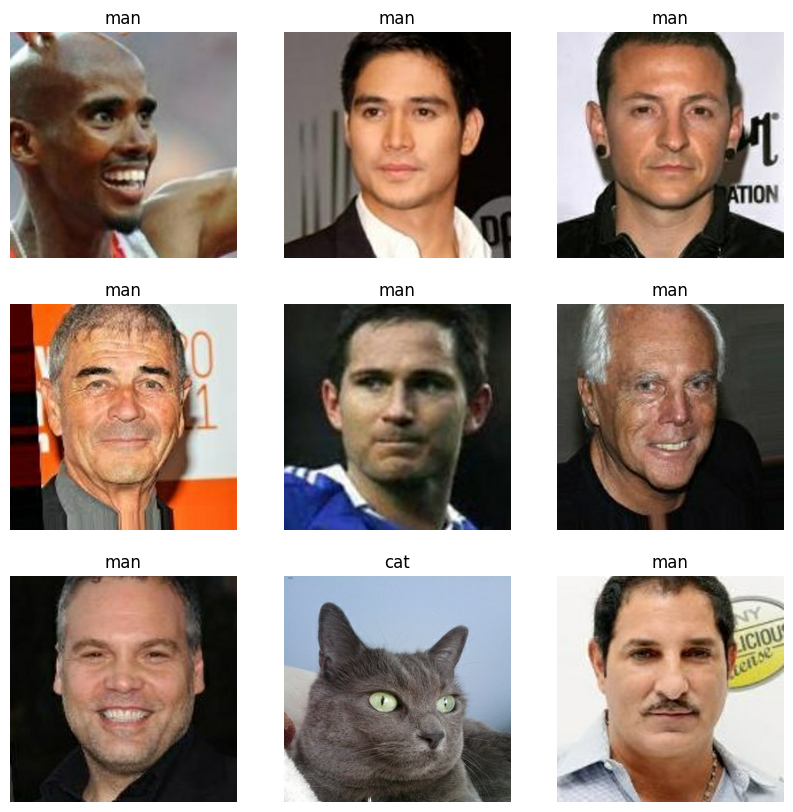

In [5]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [6]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32,)


## Model


In [7]:
def load_dataset():
    train_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir,
        validation_split=0.3,
        subset="training",
        seed=124,
        image_size=(img_height, img_width),
        batch_size=batch_size,
        label_mode="int",
        shuffle=True,
    )

    val_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir,
        validation_split=0.3,
        subset="validation",
        seed=124,
        image_size=(img_height, img_width),
        batch_size=batch_size,
        label_mode="int",
        shuffle=True,
    )

    X_train_list, y_train_list = [], []
    for x, y in train_ds:
        X_train_list.append(x.numpy())
        y_train_list.append(y.numpy())

    X_test_list, y_test_list = [], []
    for x, y in val_ds:
        X_test_list.append(x.numpy())
        y_test_list.append(y.numpy())

    X_train = np.concatenate(X_train_list, axis=0)
    y_train = np.concatenate(y_train_list, axis=0)
    X_test = np.concatenate(X_test_list, axis=0)
    y_test = np.concatenate(y_test_list, axis=0)

    # One-hot
    numClass = len(train_ds.class_names)
    y_train = to_categorical(y_train, num_classes=numClass)
    y_test = to_categorical(y_test, num_classes=numClass)

    return X_train, y_train, X_test, y_test, train_ds.class_names


def clean_data(train, test):
    """
    Prétraitement des données : conversion en float, normalisation entre 0 et 1.

    Paramètres :
    - train : tableau de données d'entraînement
    - test : tableau de données de test

    Retourne :
    - train_norm : données d'entraînement normalisées
    - test_norm : données de test normalisées
    """
    # Conversion des entiers en floats pour permettre la normalisation
    train_norm = train.astype('float32')
    test_norm = test.astype('float32')

    # Normalisation des valeurs entre 0 et 1
    train_norm /= 255.0
    test_norm /= 255.0

    return train_norm, test_norm

In [8]:
def plot_curves(histories):
    """
    Fonction pour afficher les courbes de loss et d'accuracy
    moyennées et écart-types à travers les k-folds.

    Paramètres :
    - histories (list) : Historique d'entraînement des différents plis K-folds.
    """

    # Initialisation des figures
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Extraction du nombre d'époques d'après l'un des historiques
    epochs = range(len(histories[0].history['loss']))

    # Calcul des moyennes et des écart-types pour chaque époque
    mean_loss = np.mean([history.history['loss'] for history in histories],
                        axis=0)
    std_loss = np.std([history.history['loss'] for history in histories],
                      axis=0)

    mean_val_loss = np.mean([history.history['val_loss'] for history in histories],
                            axis=0)
    std_val_loss = np.std([history.history['val_loss'] for history in histories],
                          axis=0)

    mean_accuracy = np.mean([history.history['accuracy'] for history in histories],
                            axis=0)
    std_accuracy = np.std([history.history['accuracy'] for history in histories],
                          axis=0)

    mean_val_accuracy = np.mean([history.history['val_accuracy'] for history in histories],
                                axis=0)
    std_val_accuracy = np.std([history.history['val_accuracy'] for history in histories],
                              axis=0)

    # Couleurs pour les courbes
    train_color = 'blue'
    val_color = 'orange'

    # Courbes de loss avec moyenne et écart-type
    ax1.plot(epochs, mean_loss, color=train_color, label='Train')
    ax1.fill_between(epochs, mean_loss - std_loss, mean_loss + std_loss,
                     color=train_color, alpha=0.2)

    ax1.plot(epochs, mean_val_loss, color=val_color, label='Validation')
    ax1.fill_between(epochs, mean_val_loss - std_val_loss,
                     mean_val_loss + std_val_loss, color=val_color, alpha=0.2)

    # Courbes d'accuracy avec moyenne et écart-type
    ax2.plot(epochs, mean_accuracy, color=train_color, label='Train')
    ax2.fill_between(epochs, mean_accuracy - std_accuracy,
                     mean_accuracy + std_accuracy, color=train_color, alpha=0.2)

    ax2.plot(epochs, mean_val_accuracy, color=val_color, label='Validation')
    ax2.fill_between(epochs, mean_val_accuracy - std_val_accuracy,
                     mean_val_accuracy + std_val_accuracy,
                     color=val_color, alpha=0.2)

    # Titres, labels et légendes
    ax1.set_title(f'Loss (k={len(histories)})')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()

    ax2.set_title(f'Accuracy (k={len(histories)})')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    plt.show()

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    x = Dense(100, activation='relu', name="Dense_1")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [17]:
def evaluate_model(model, dataX, dataY, folds=5, epochs=10):
    """
    Évalue le modèle avec une validation croisée K-fold.

    Paramètres :
    - model : modèle de réseau de neurones Keras à évaluer.
    - dataX : données d'entrée pour l'entraînement et la validation.
    - dataY : étiquettes de sortie correspondantes.
    - folds : nombre de splits pour la validation croisée.
    - epochs : nombre d'époques pour l'entraînement de chaque split.

    Retourne :
    - scores : liste des scores d'accuracy du modèle pour chaque split.
    - histories : liste des historique d'entraînement pour chaque split.
    """
    scores, histories = [], []  # Initialisation des scores et historiques
    kfold = KFold(n_splits=folds, shuffle=True, random_state=1)

    # Itération sur chaque split généré par le K-fold
    for train_ix, test_ix in kfold.split(dataX):
        # Sélection des données d'entraînement et de test pour le fold
        X_train, y_train = dataX[train_ix], dataY[train_ix]
        X_test, y_test = dataX[test_ix], dataY[test_ix]

        # Réinitialisation du modèle avant chaque itération
        model = define_model()


        # Entraînement du modèle
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # Évaluation du modèle sur les données de test actuelles
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print(f'Précision : {acc * 100:.3f}%')

        # Stockage de l'historique
        scores.append(acc)
        histories.append(history)

    return scores, histories

In [18]:
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

## train cnn model

In [19]:
def train_cnn_model(model, train_ds, val_data, model_path,
                    epochs=10, patience=3, mult_datagen=1):
    """
    Entraîne un modèle CNN avec un générateur de données et des callbacks.

    Args:
        model: Modèle CNN à entraîner.
        train_generator: Générateur d'images pour l'entraînement.
        val_data: Données de validation (X_test, y_test).
        model_path (str): Chemin de sauvegarde du modèle.
        epochs (int): Nombre d'époques d'entraînement.
        patience (int): Patience pour l'arrêt anticipé.
        mult_datagen (int): Facteur de multiplication pour le nombre d'images par époque (augmentation de données).
    Returns:
        Modèle entraîné avec les meilleurs poids restaurés.
    """
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=patience,
                      restore_best_weights=True, verbose=1),
        ModelCheckpoint(model_path, monitor='val_loss',
                        save_best_only=True, verbose=1)
    ]
    base_steps = int(np.ceil(len(X_train) / batch_size))
    steps_per_epoch = mult_datagen * base_steps  # len = ceil(n_samples / batch_size)
    print(f"Image par epoch(avec datagen) : {steps_per_epoch * batch_size}, nb image par batch : {batch_size}")
    model.fit(
        train_ds,
        epochs=epochs,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_data,
        callbacks=callbacks,
        verbose=1
    )

    return model


## fonctions d'affichage

In [20]:
def prediction():
    # Chargement du modèle sauvegardé
    model_filename = "CNN_LV.keras"
    model_path = os.path.join(model_dir, model_filename)
    model = load_model(model_path)
    
    numimage = 110

    # Prédiction
    y_pred = model.predict(X_test[numimage:numimage+25])  # Prédire 25 image
    y_pred_labels = np.argmax(y_pred, axis=1)

    # Conversion de y_test
    y_true_labels = np.argmax(y_test, axis=1)
    plt.figure(figsize=(10,15))
    columns = 25
    for i in range(columns):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(X_test[i+numimage],cmap=plt.cm.binary)
        plt.xlabel("True label: " + class_names[y_true_labels[i+numimage]] + "\n Predicted: " + class_names[y_pred_labels[i]])

In [21]:
def matrice():
    # Chargement du modèle sauvegardé
    model_filename = "CNN_LV.keras"
    model_path = os.path.join(model_dir, model_filename)
    model = load_model(model_path)

    # Prédiction
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=1)

    # Conversion de y_test
    y_true_labels = np.argmax(y_test, axis=1)

    # Matrice de confusion
    conf = confusion_matrix(y_true_labels, y_pred_labels)

    # Affichage
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title("Matrice de confusion")
    plt.xlabel("Prédictions")
    plt.ylabel("Vérité terrain")
    plt.tight_layout()
    plt.show()

# Code Comparaison
## 1 Conv 1 Dense

In [ ]:
e=[]
k=5
epochs=10
shapeinput=(64, 64, 3) # Format de l'image
run_evaluation(k,epochs)

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,613,811 (196.89 MB)

 Trainable params: 51,613,811 (196.89 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


ValueError: Input 0 of layer "Baseline_CNN" is incompatible with the layer: expected shape=(None, 256, 256, 2), found shape=(32, 256, 256, 3)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,614,099 (196.89 MB)

 Trainable params: 51,614,099 (196.89 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
 130/1600 ━━━━━━━━━━━━━━━━━━━━ 15:10 620ms/step - accuracy: 0.5057 - loss: 1.0279

KeyboardInterrupt: 

In [ ]:
tf.keras.backend.clear_session()
# Chargement du modèle sauvegardé
model_filename = "CNN_LV.keras"
model_path = os.path.join(model_dir, model_filename)
model = load_model(model_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


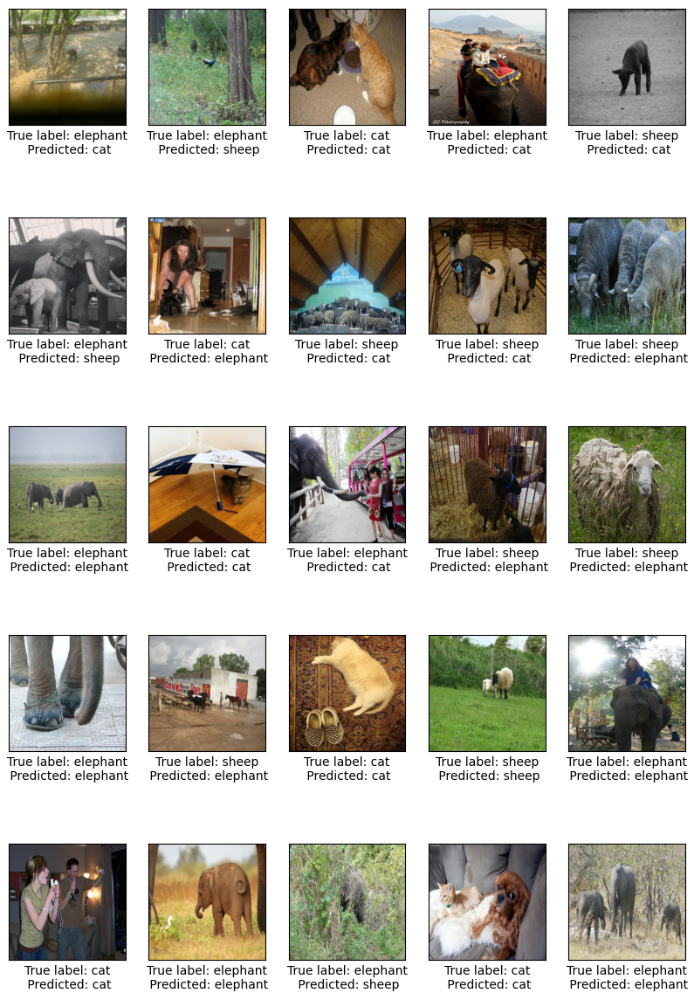

In [ ]:
numimage = 110

# Prédiction
y_pred = model.predict(X_test[numimage:numimage+25])  # Prédire 25 image
y_pred_labels = np.argmax(y_pred, axis=1)

# Conversion de y_test
y_true_labels = np.argmax(y_test, axis=1)
plt.figure(figsize=(10,15))
columns = 25
for i in range(columns):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_test[i+numimage],cmap=plt.cm.binary)
    plt.xlabel("True label: " + class_names[y_true_labels[i+numimage]] + "\n Predicted: " + class_names[y_pred_labels[i]])

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step


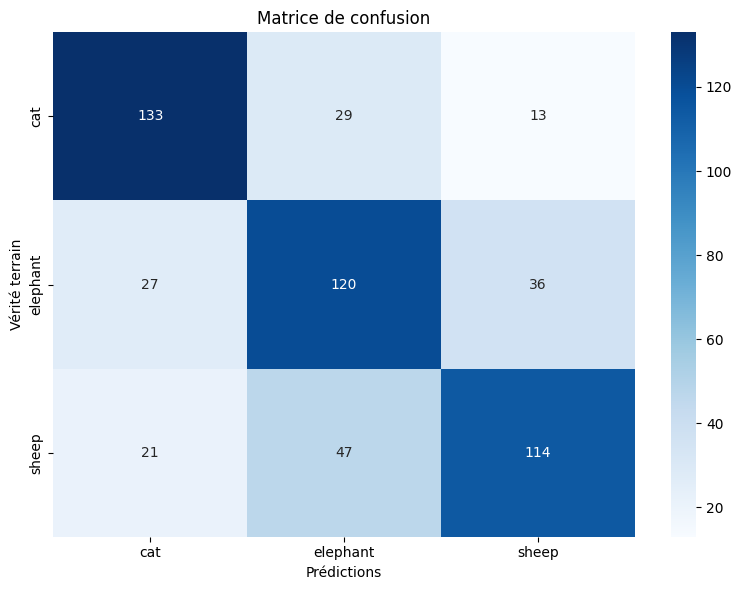

In [ ]:
# Chargement du modèle sauvegardé
model_filename = "CNN_LV.keras"
model_path = os.path.join(model_dir, model_filename)
model = load_model(model_path)

# Prédiction
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)

# Conversion de y_test
y_true_labels = np.argmax(y_test, axis=1)

# Matrice de confusion
conf = confusion_matrix(y_true_labels, y_pred_labels)

# Affichage
plt.figure(figsize=(8, 6))
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title("Matrice de confusion")
plt.xlabel("Prédictions")
plt.ylabel("Vérité terrain")
plt.tight_layout()
plt.show()

## 3 Conv 1 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
   # Définir l'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # conv
    x = Conv2D(2, (3, 3), activation='relu', name="Conv1_Layer")(inputs)
    x = MaxPooling2D((2, 2), name="Pool1_Layer")(x)
    x = Conv2D(3, (5, 5), activation='relu', name="Conv2_Layer")(x)
    x = MaxPooling2D((2, 2), name="Pool2_Layer")(x)
    x = Conv2D(6, (3, 3), activation='relu', name="Conv3_Layer")(x)
    x = MaxPooling2D((2, 2), name="Pool3_Layer")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(1):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def evaluate_model(model, dataX, dataY, folds=5, epochs=10):
    """
    Évalue le modèle avec une validation croisée K-fold.

    Paramètres :
    - model : modèle de réseau de neurones Keras à évaluer.
    - dataX : données d'entrée pour l'entraînement et la validation.
    - dataY : étiquettes de sortie correspondantes.
    - folds : nombre de splits pour la validation croisée.
    - epochs : nombre d'époques pour l'entraînement de chaque split.

    Retourne :
    - scores : liste des scores d'accuracy du modèle pour chaque split.
    - histories : liste des historique d'entraînement pour chaque split.
    """
    scores, histories = [], []  # Initialisation des scores et historiques
    kfold = KFold(n_splits=folds, shuffle=True, random_state=1)

    # Itération sur chaque split généré par le K-fold
    for train_ix, test_ix in kfold.split(dataX):
        # Sélection des données d'entraînement et de test pour le fold
        X_train, y_train = dataX[train_ix], dataY[train_ix]
        X_test, y_test = dataX[test_ix], dataY[test_ix]

        # Réinitialisation du modèle avant chaque itération
        model = define_model()


        # Entraînement du modèle
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # Évaluation du modèle sur les données de test actuelles
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print(f'Précision : {acc * 100:.3f}%')

        # Stockage de l'historique
        scores.append(acc)
        histories.append(history)

    return scores, histories
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv1_Layer (Conv2D)            │ (None, 254, 254, 2)    │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1_Layer (MaxPooling2D)      │ (None, 127, 127, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2_Layer (Conv2D)            │ (None, 123, 123, 3)    │           153 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2_Layer (MaxPooling2D)      │ (None, 61, 61, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3_Layer (Conv2D)            │ (None, 59, 59, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3_Layer (MaxPooling2D)      │ (None, 29, 29, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 5046)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │       504,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 505,380 (1.93 MB)

 Trainable params: 505,380 (1.93 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.3978 - loss: 1.0792 - val_accuracy: 0.4563 - val_loss: 1.0612
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.4504 - loss: 1.0564 - val_accuracy: 0.4484 - val_loss: 1.0565
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.5367 - loss: 1.0088 - val_accuracy: 0.4524 - val_loss: 1.1726
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.5129 - loss: 1.0078 - val_accuracy: 0.5833 - val_loss: 0.9432
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.6101 - loss: 0.9015 - val_accuracy: 0.6032 - val_loss: 0.8903
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.6121 - loss: 0.8833 - val_accuracy: 0.5357 - val_loss: 0.9386
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.6190 - loss: 0.8855 - val_accuracy: 0.5754 - val_loss: 0.9055
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.6230 - loss: 0.8561 - val_accuracy: 0.575

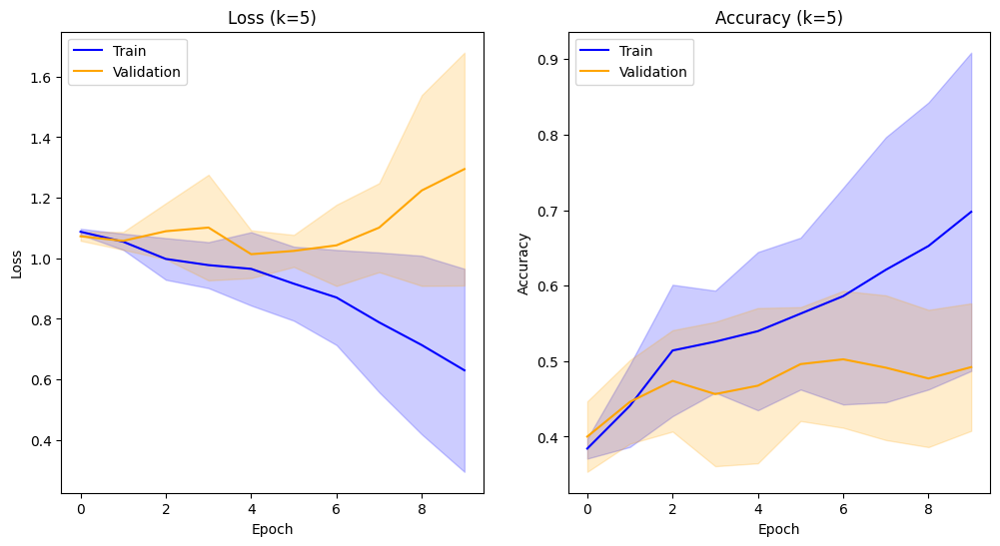

Précision : moyenne=49.206% écart-type=8.448%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv1_Layer (Conv2D)            │ (None, 254, 254, 2)    │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1_Layer (MaxPooling2D)      │ (None, 127, 127, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2_Layer (Conv2D)            │ (None, 123, 123, 3)    │           153 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2_Layer (MaxPooling2D)      │ (None, 61, 61, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3_Layer (Conv2D)            │ (None, 59, 59, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3_Layer (MaxPooling2D)      │ (None, 29, 29, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 5046)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │       504,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 505,380 (1.93 MB)

 Trainable params: 505,380 (1.93 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=epochs, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.6272 - loss: 0.8317
Epoch 1: val_loss improved from None to 0.75232, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 144s 90ms/step - accuracy: 0.6603 - loss: 0.7754 - val_accuracy: 0.7000 - val_loss: 0.7523
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.7304 - loss: 0.6410
Epoch 2: val_loss did not improve from 0.75232
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 136s 85ms/step - accuracy: 0.7451 - loss: 0.6116 - val_accuracy: 0.6889 - val_loss: 0.8010
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.7757 - loss: 0.5503
Epoch 3: val_loss did not improve from 0.75232
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 138s 86ms/step - accuracy: 0.7839 - loss: 0.5296 - val_accuracy: 0.7093 - val_loss: 0.8920
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.8030 - loss: 0.4856
Epoch 4: val_loss did not improv

In [ ]:
tf.keras.backend.clear_session()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


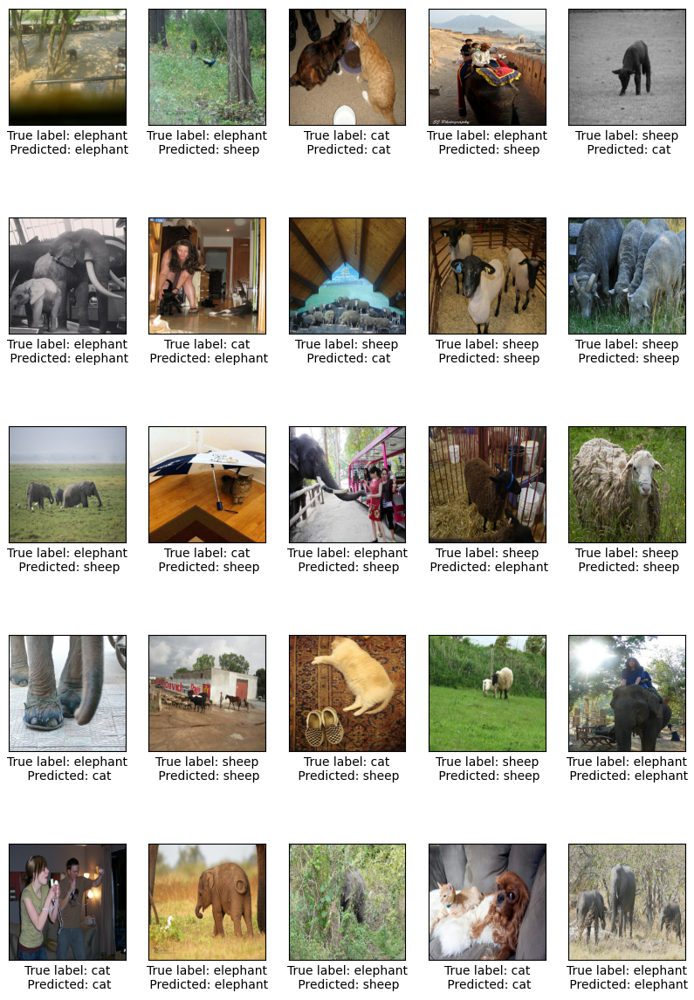

In [ ]:
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


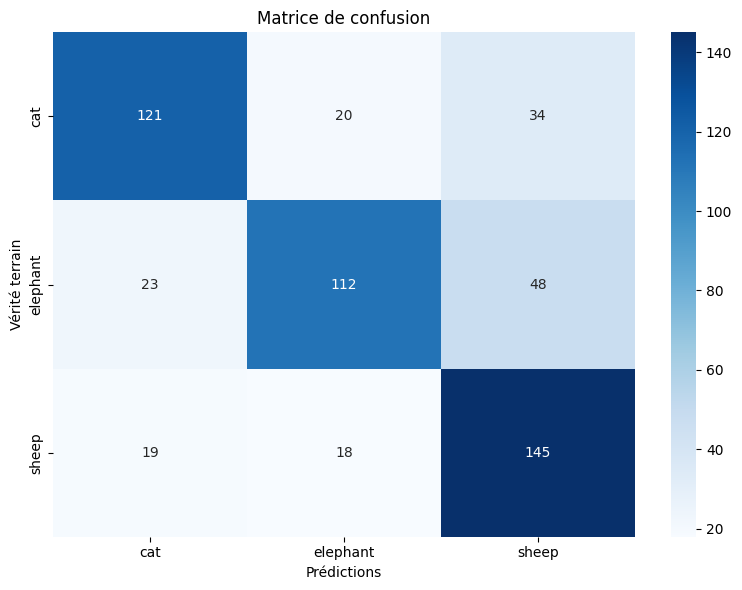

In [ ]:
matrice()

## 6 Conv 1 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(5):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(1):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def evaluate_model(model, dataX, dataY, folds=5, epochs=10):
    """
    Évalue le modèle avec une validation croisée K-fold.

    Paramètres :
    - model : modèle de réseau de neurones Keras à évaluer.
    - dataX : données d'entrée pour l'entraînement et la validation.
    - dataY : étiquettes de sortie correspondantes.
    - folds : nombre de splits pour la validation croisée.
    - epochs : nombre d'époques pour l'entraînement de chaque split.

    Retourne :
    - scores : liste des scores d'accuracy du modèle pour chaque split.
    - histories : liste des historique d'entraînement pour chaque split.
    """
    scores, histories = [], []  # Initialisation des scores et historiques
    kfold = KFold(n_splits=folds, shuffle=True, random_state=1)

    # Itération sur chaque split généré par le K-fold
    for train_ix, test_ix in kfold.split(dataX):
        # Sélection des données d'entraînement et de test pour le fold
        X_train, y_train = dataX[train_ix], dataY[train_ix]
        X_test, y_test = dataX[test_ix], dataY[test_ix]

        # Réinitialisation du modèle avant chaque itération
        model = define_model()


        # Entraînement du modèle
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # Évaluation du modèle sur les données de test actuelles
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print(f'Précision : {acc * 100:.3f}%')

        # Stockage de l'historique
        scores.append(acc)
        histories.append(history)

    return scores, histories

def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 60,339 (235.70 KB)

 Trainable params: 60,339 (235.70 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - accuracy: 0.3631 - loss: 1.0967 - val_accuracy: 0.4325 - val_loss: 1.0919
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 272ms/step - accuracy: 0.3879 - loss: 1.0905 - val_accuracy: 0.3452 - val_loss: 1.0857
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 278ms/step - accuracy: 0.4196 - loss: 1.0788 - val_accuracy: 0.4405 - val_loss: 1.0603
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 279ms/step - accuracy: 0.4950 - loss: 1.0292 - val_accuracy: 0.3492 - val_loss: 1.0906
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 279ms/step - accuracy: 0.5000 - loss: 1.0147 - val_accuracy: 0.5079 - val_loss: 1.0032
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 286ms/step - accuracy: 0.4683 - loss: 1.0300 - val_accuracy: 0.5159 - val_loss: 0.9868
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - accuracy: 0.5685 - loss: 0.9539 - val_accuracy: 0.5675 - val_loss: 0.9806
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 255ms/step - accuracy: 0.5873 - loss: 0.9224 - val_accura

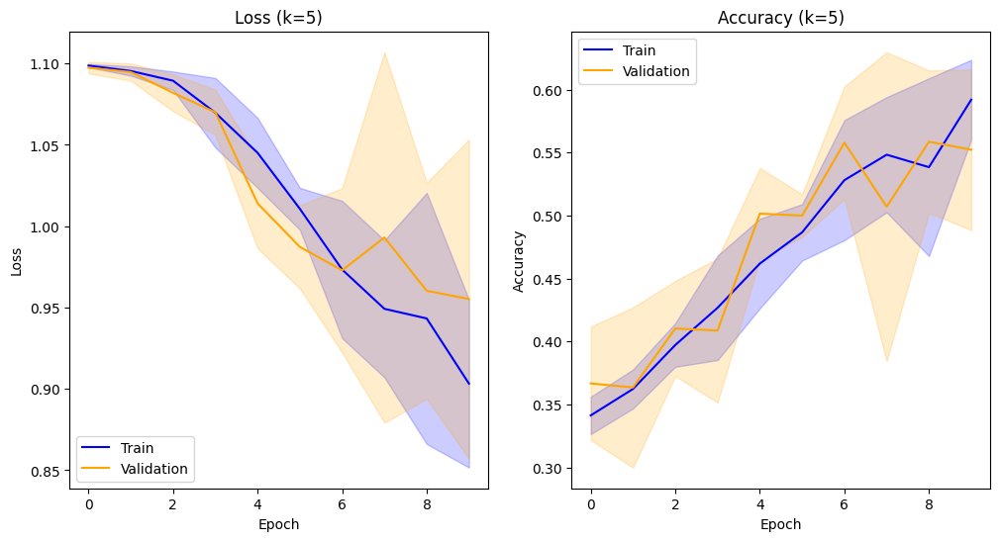

Précision : moyenne=55.238% écart-type=6.381%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 60,339 (235.70 KB)

 Trainable params: 60,339 (235.70 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = define_model()
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.5540 - loss: 0.9058
Epoch 1: val_loss improved from None to 0.69164, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 815s 508ms/step - accuracy: 0.6591 - loss: 0.7599 - val_accuracy: 0.7315 - val_loss: 0.6916
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.7920 - loss: 0.5142
Epoch 2: val_loss did not improve from 0.69164
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 801s 501ms/step - accuracy: 0.8104 - loss: 0.4707 - val_accuracy: 0.7444 - val_loss: 0.7378
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - accuracy: 0.8609 - loss: 0.3554
Epoch 3: val_loss did not improve from 0.69164
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 800s 500ms/step - accuracy: 0.8721 - loss: 0.3258 - val_accuracy: 0.7389 - val_loss: 0.7575
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.9008 - loss: 0.2573
Epoch 4: val_loss did not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


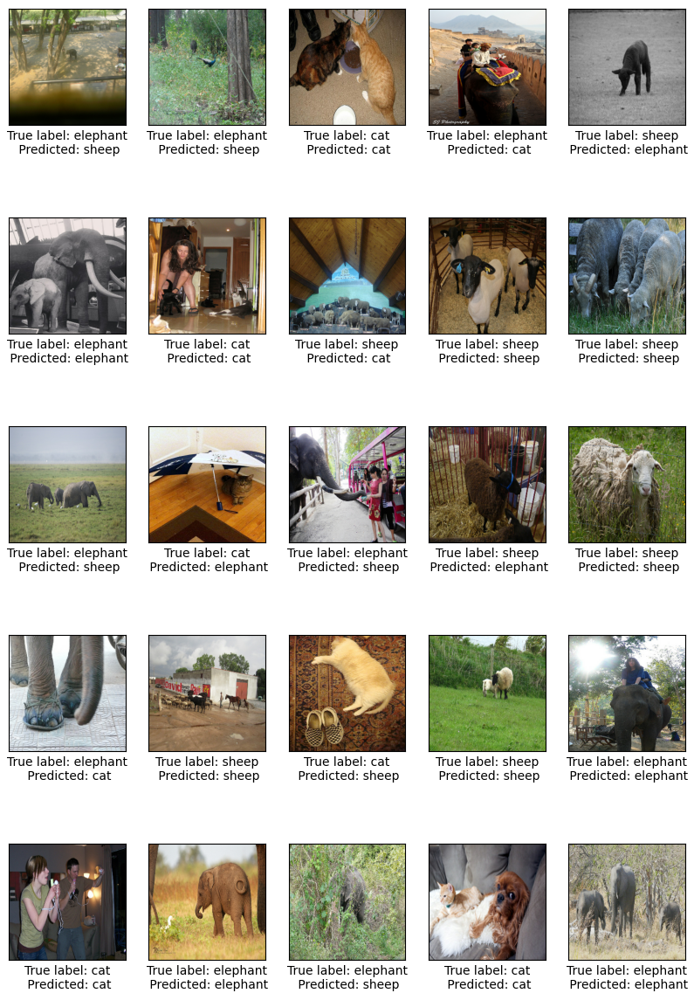

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step


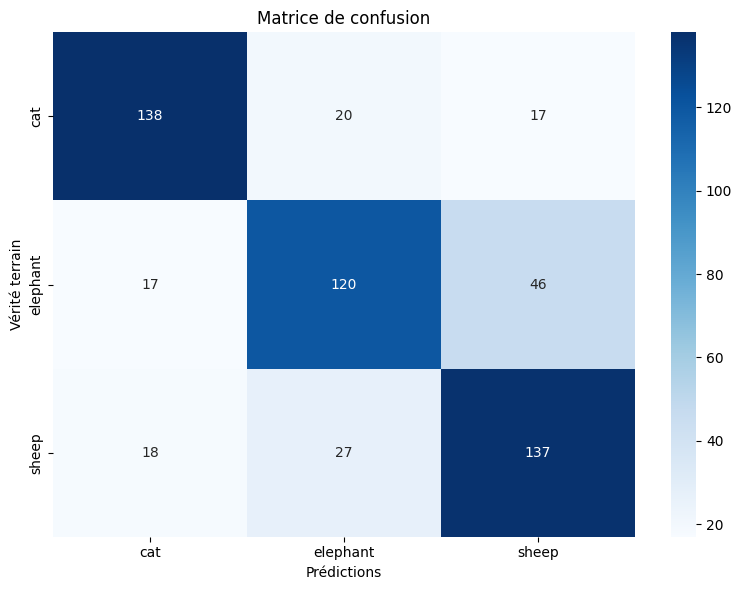

In [ ]:
matrice()

## 1 Conv 3 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    for i in range(1):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+1}")(inputs)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+1}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(3):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,634,299 (196.97 MB)

 Trainable params: 51,634,299 (196.97 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 15s 426ms/step - accuracy: 0.3889 - loss: 1.2239 - val_accuracy: 0.5238 - val_loss: 0.9927
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 398ms/step - accuracy: 0.5288 - loss: 0.9815 - val_accuracy: 0.4206 - val_loss: 1.1093
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 381ms/step - accuracy: 0.5456 - loss: 0.9286 - val_accuracy: 0.6190 - val_loss: 0.8617
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 370ms/step - accuracy: 0.6409 - loss: 0.8308 - val_accuracy: 0.6190 - val_loss: 0.8919
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 372ms/step - accuracy: 0.6607 - loss: 0.8090 - val_accuracy: 0.5992 - val_loss: 0.8955
Précision : 59.921%
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 370ms/step - accuracy: 0.3700 - loss: 1.1180 - val_accuracy: 0.3294 - val_loss: 1.1182
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 363ms/step - accuracy: 0.4782 - loss: 1.0244 - val_accuracy: 0.4127 - val_loss: 1.0104
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 367ms/step - accuracy: 0.5357 - loss: 

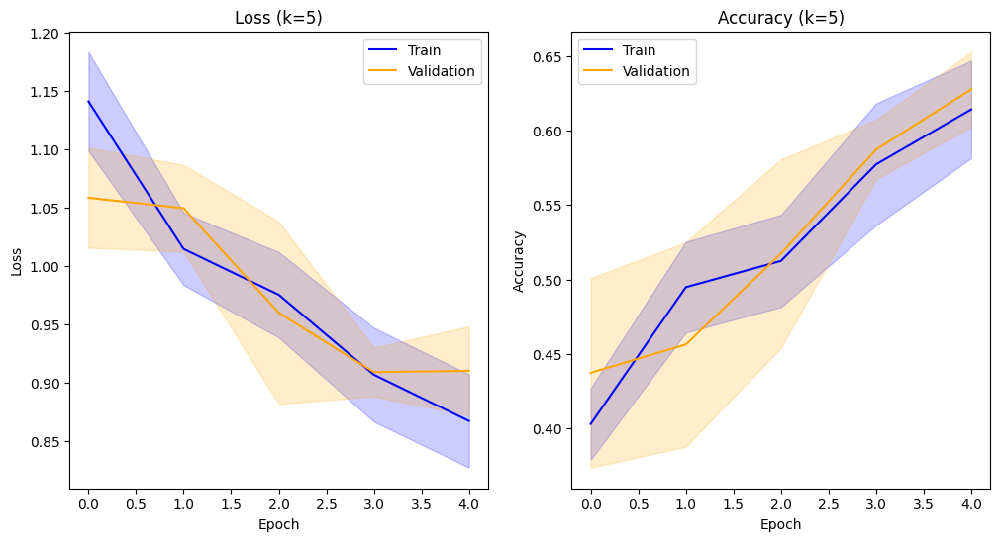

Précision : moyenne=62.778% écart-type=2.502%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


In [ ]:
model = define_model()
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=epochs, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 615ms/step - accuracy: 0.5926 - loss: 0.8576
Epoch 1: val_loss improved from None to 0.90000, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 990s 618ms/step - accuracy: 0.6724 - loss: 0.7352 - val_accuracy: 0.6926 - val_loss: 0.9000
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accuracy: 0.7744 - loss: 0.5349
Epoch 2: val_loss did not improve from 0.90000
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 878s 549ms/step - accuracy: 0.7951 - loss: 0.4889 - val_accuracy: 0.6556 - val_loss: 1.1785
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.8460 - loss: 0.3811
Epoch 3: val_loss did not improve from 0.90000
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 884s 553ms/step - accuracy: 0.8600 - loss: 0.3500 - val_accuracy: 0.6463 - val_loss: 1.4226
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.8920 - loss: 0.2758
Epoch 4: val_loss did not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


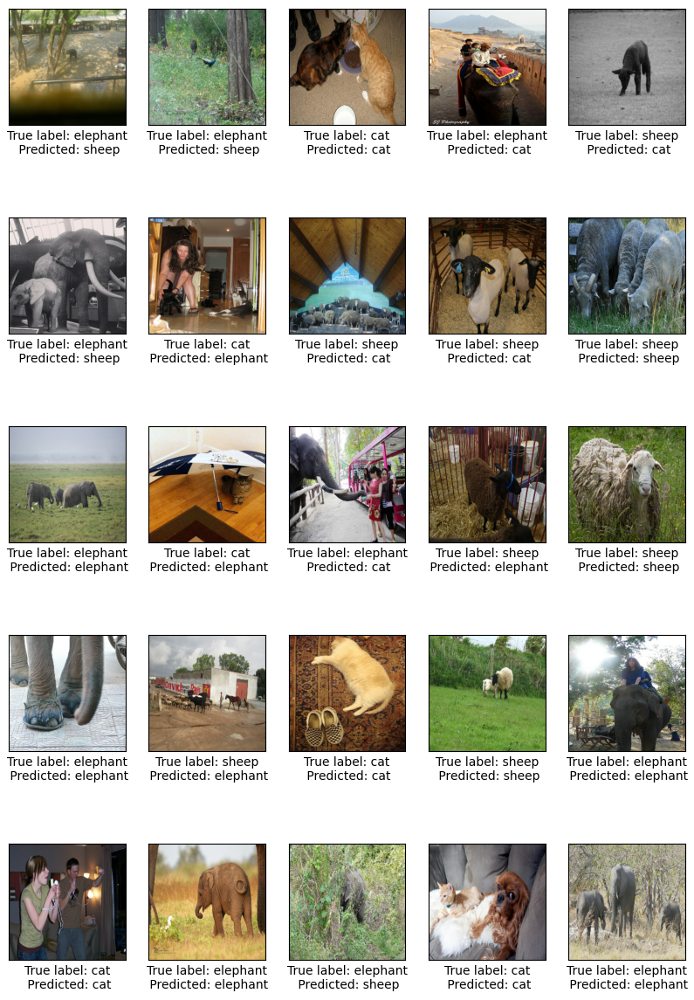

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step


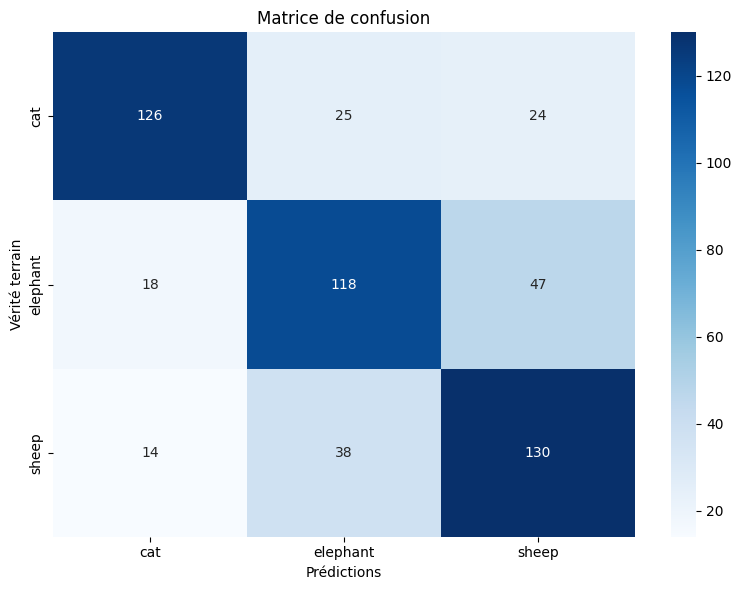

In [ ]:
matrice()

## 3 Conv 3 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(2):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)


    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(3):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,919,995 (11.14 MB)

 Trainable params: 2,919,995 (11.14 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.3671 - loss: 1.0945 - val_accuracy: 0.3452 - val_loss: 1.0879
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - accuracy: 0.4415 - loss: 1.0705 - val_accuracy: 0.4246 - val_loss: 1.0487
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - accuracy: 0.4841 - loss: 1.0232 - val_accuracy: 0.5000 - val_loss: 1.0649
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - accuracy: 0.4960 - loss: 1.0047 - val_accuracy: 0.5198 - val_loss: 1.0175
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - accuracy: 0.5486 - loss: 0.9283 - val_accuracy: 0.5119 - val_loss: 0.9518
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - accuracy: 0.5833 - loss: 0.8993 - val_accuracy: 0.5992 - val_loss: 0.8671
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - accuracy: 0.6508 - loss: 0.8164 - val_accuracy: 0.6429 - val_loss: 0.8386
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - accuracy: 0.6677 - loss: 0.7928 - val_accurac

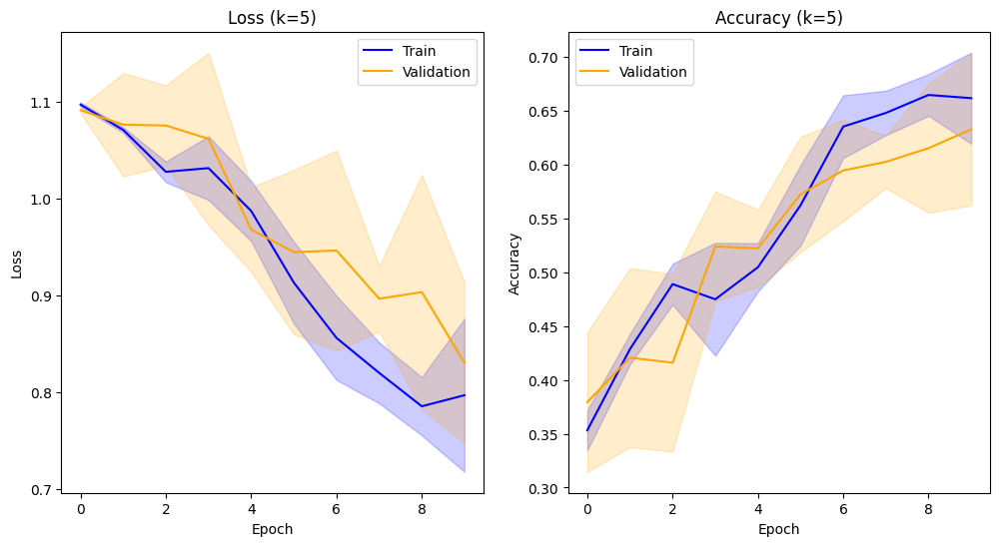

Précision : moyenne=63.254% écart-type=7.070%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,919,995 (11.14 MB)

 Trainable params: 2,919,995 (11.14 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=epochs, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step - accuracy: 0.6139 - loss: 0.8265
Epoch 1: val_loss improved from None to 0.85206, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 787s 491ms/step - accuracy: 0.7000 - loss: 0.6846 - val_accuracy: 0.6852 - val_loss: 0.8521
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.8361 - loss: 0.4090
Epoch 2: val_loss did not improve from 0.85206
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 814s 509ms/step - accuracy: 0.8639 - loss: 0.3462 - val_accuracy: 0.7185 - val_loss: 1.0631
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.9167 - loss: 0.2219
Epoch 3: val_loss did not improve from 0.85206
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 814s 508ms/step - accuracy: 0.9294 - loss: 0.1924 - val_accuracy: 0.7222 - val_loss: 1.5485
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.9511 - loss: 0.1371
Epoch 4: val_loss did not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


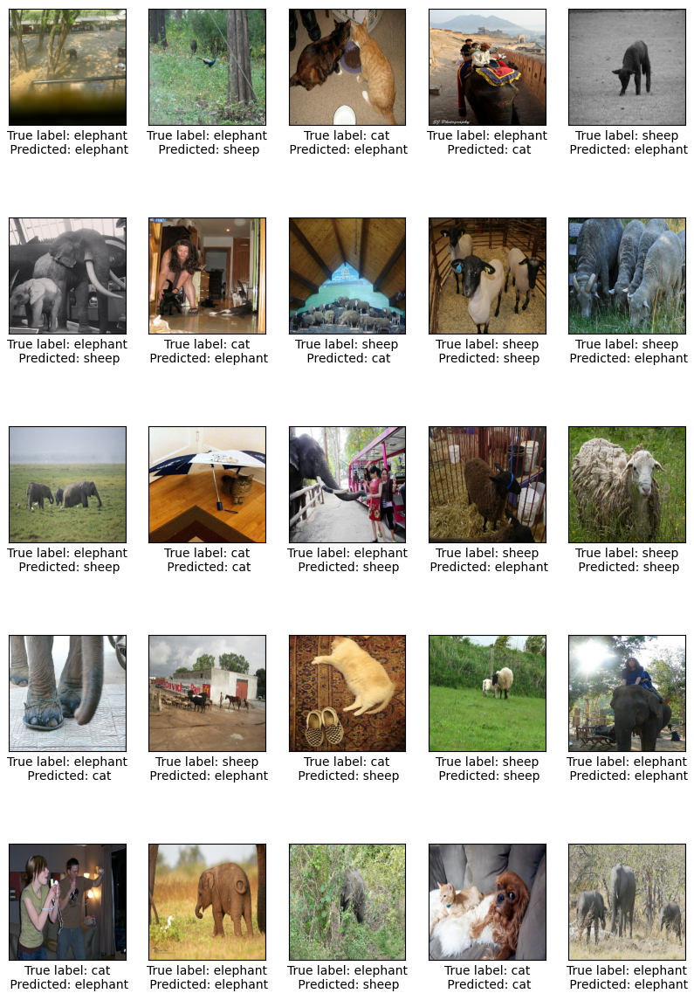

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step


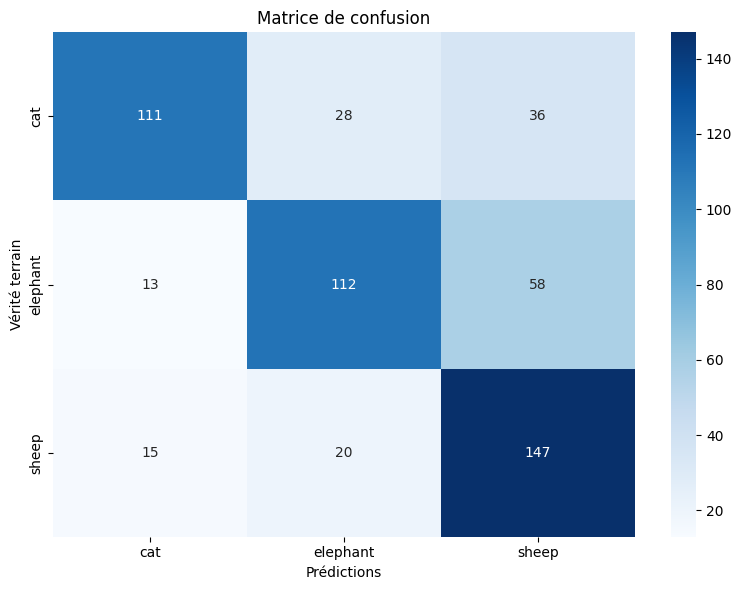

In [ ]:
matrice()

## 6 Conv 3 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(5):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(3):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,539 (314.61 KB)

 Trainable params: 80,539 (314.61 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 277ms/step - accuracy: 0.3452 - loss: 1.0983 - val_accuracy: 0.3373 - val_loss: 1.0964
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 271ms/step - accuracy: 0.3542 - loss: 1.0961 - val_accuracy: 0.3968 - val_loss: 1.0924
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 254ms/step - accuracy: 0.3770 - loss: 1.0913 - val_accuracy: 0.4008 - val_loss: 1.0871
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - accuracy: 0.4474 - loss: 1.0729 - val_accuracy: 0.4365 - val_loss: 1.0675
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - accuracy: 0.4107 - loss: 1.0600 - val_accuracy: 0.3413 - val_loss: 1.0925
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - accuracy: 0.4603 - loss: 1.0506 - val_accuracy: 0.4603 - val_loss: 1.0267
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 269ms/step - accuracy: 0.5010 - loss: 0.9972 - val_accuracy: 0.5556 - val_loss: 0.9792
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - accuracy: 0.5427 - loss: 0.9579 - val_accura

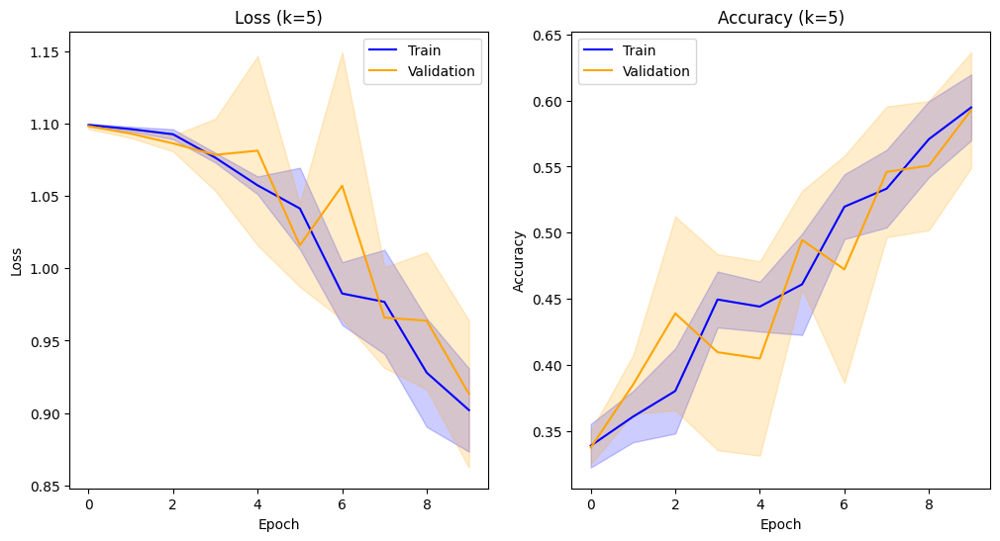

Précision : moyenne=59.286% écart-type=4.380%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,539 (314.61 KB)

 Trainable params: 80,539 (314.61 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.5496 - loss: 0.9215
Epoch 1: val_loss improved from None to 0.70294, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 837s 522ms/step - accuracy: 0.6409 - loss: 0.7945 - val_accuracy: 0.7259 - val_loss: 0.7029
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - accuracy: 0.7675 - loss: 0.5668
Epoch 2: val_loss did not improve from 0.70294
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 913s 571ms/step - accuracy: 0.7834 - loss: 0.5308 - val_accuracy: 0.7074 - val_loss: 0.7383
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - accuracy: 0.8285 - loss: 0.4273
Epoch 3: val_loss did not improve from 0.70294
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 902s 563ms/step - accuracy: 0.8401 - loss: 0.3976 - val_accuracy: 0.7167 - val_loss: 0.8072
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.8767 - loss: 0.3116
Epoch 4: val_loss did not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


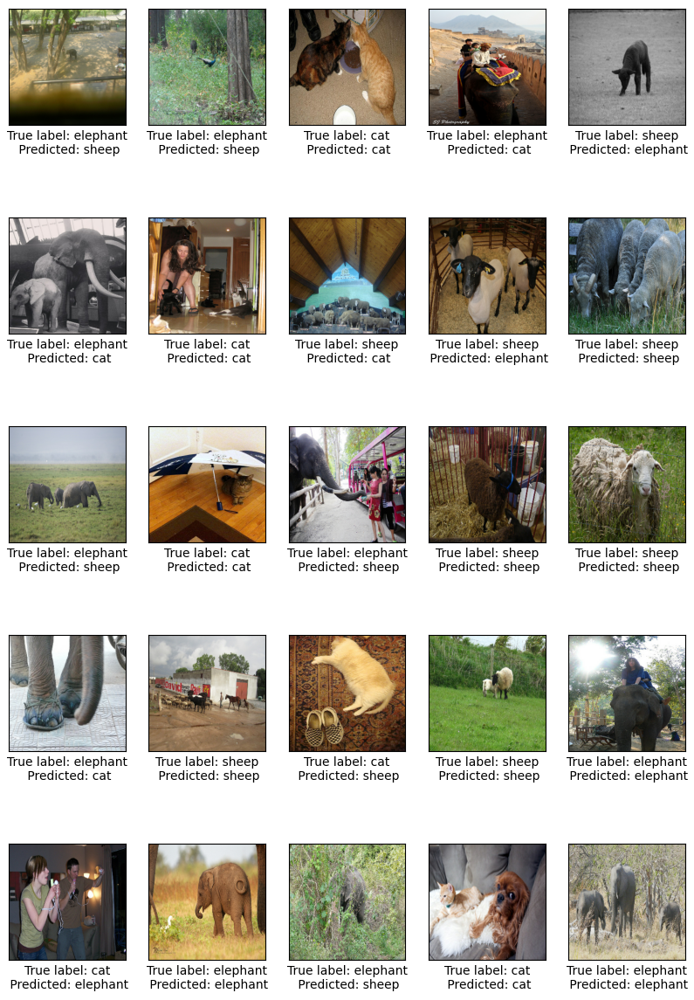

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step


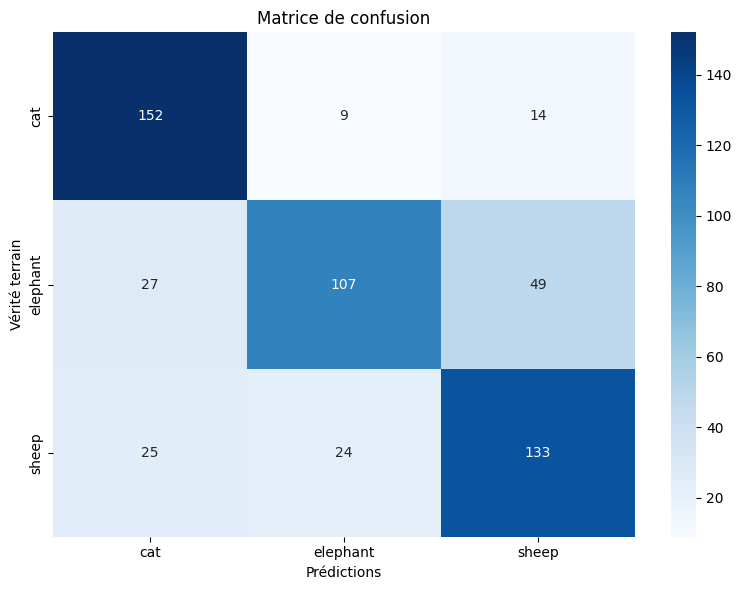

In [ ]:
matrice()

## 1 Conv 6 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    for i in range(1):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+1}")(inputs)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+1}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(6):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,664,599 (197.08 MB)

 Trainable params: 51,664,599 (197.08 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 16s 380ms/step - accuracy: 0.3502 - loss: 1.1012 - val_accuracy: 0.3333 - val_loss: 1.0984
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 355ms/step - accuracy: 0.4762 - loss: 1.0441 - val_accuracy: 0.4603 - val_loss: 1.0335
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 348ms/step - accuracy: 0.4881 - loss: 1.0339 - val_accuracy: 0.3532 - val_loss: 1.1366
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 358ms/step - accuracy: 0.3373 - loss: 1.1200 - val_accuracy: 0.3413 - val_loss: 1.1031
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 344ms/step - accuracy: 0.4137 - loss: 1.0629 - val_accuracy: 0.4881 - val_loss: 1.0156
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 344ms/step - accuracy: 0.5149 - loss: 0.9931 - val_accuracy: 0.4841 - val_loss: 1.0230
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 351ms/step - accuracy: 0.5407 - loss: 0.9912 - val_accuracy: 0.3968 - val_loss: 1.1104
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 334ms/step - accuracy: 0.5069 - loss: 1.0215 - val

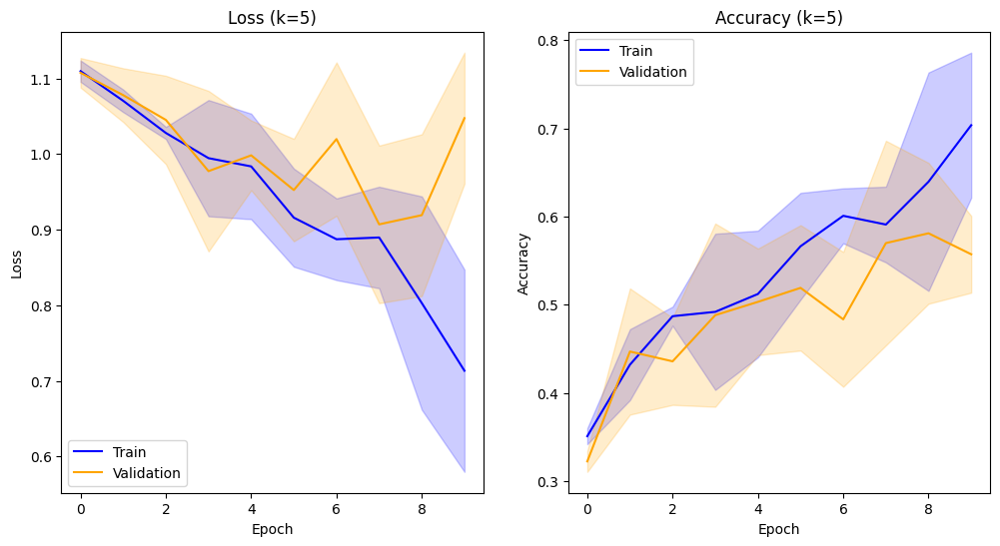

Précision : moyenne=55.714% écart-type=4.359%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


In [ ]:
model = define_model()
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 549ms/step - accuracy: 0.5822 - loss: 0.8760
Epoch 1: val_loss improved from None to 0.81263, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 883s 551ms/step - accuracy: 0.6630 - loss: 0.7595 - val_accuracy: 0.6685 - val_loss: 0.8126
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 554ms/step - accuracy: 0.7558 - loss: 0.5738
Epoch 2: val_loss did not improve from 0.81263
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 888s 555ms/step - accuracy: 0.7734 - loss: 0.5326 - val_accuracy: 0.6574 - val_loss: 1.0171
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - accuracy: 0.8157 - loss: 0.4403
Epoch 3: val_loss did not improve from 0.81263
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 891s 557ms/step - accuracy: 0.8300 - loss: 0.4101 - val_accuracy: 0.6648 - val_loss: 1.2639
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.8631 - loss: 0.3390
Epoch 4: val_loss did not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


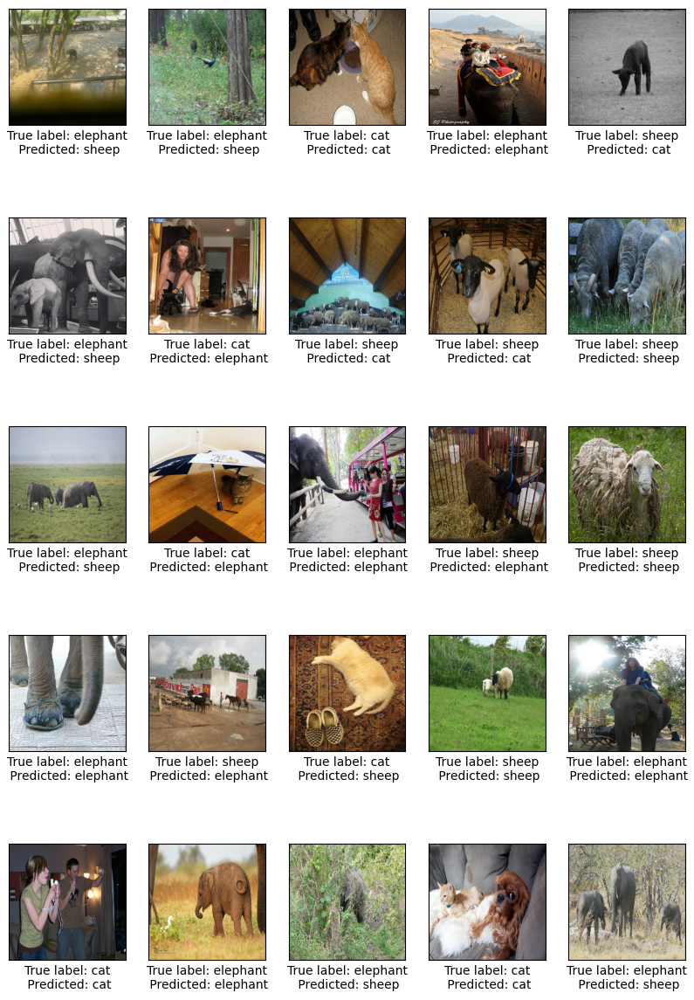

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step


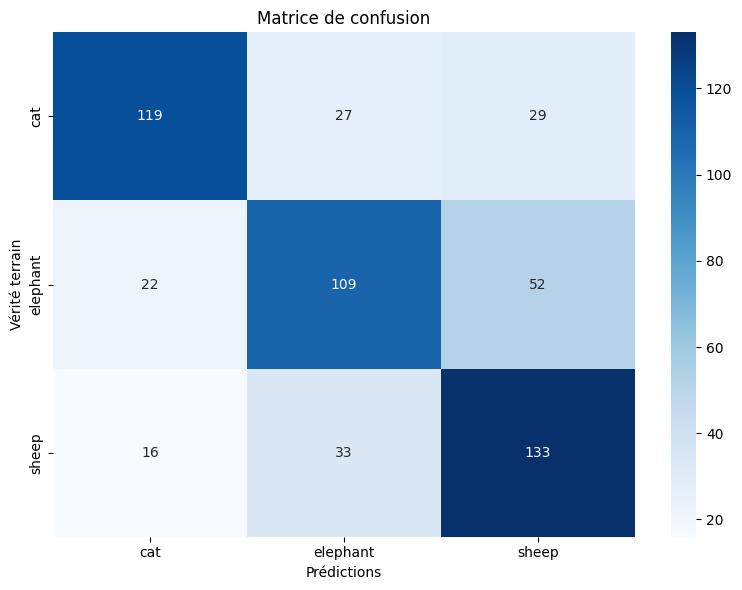

In [ ]:
matrice()

## 3 Conv 6 Dense

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(2):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(6):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,950,295 (11.25 MB)

 Trainable params: 2,950,295 (11.25 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - accuracy: 0.3581 - loss: 1.0930 - val_accuracy: 0.3690 - val_loss: 1.0979
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 263ms/step - accuracy: 0.4038 - loss: 1.0708 - val_accuracy: 0.4603 - val_loss: 1.0574
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 259ms/step - accuracy: 0.4335 - loss: 1.0622 - val_accuracy: 0.3492 - val_loss: 1.0709
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - accuracy: 0.4663 - loss: 1.0269 - val_accuracy: 0.3651 - val_loss: 1.0811
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - accuracy: 0.4673 - loss: 1.0388 - val_accuracy: 0.4563 - val_loss: 1.0353
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - accuracy: 0.5050 - loss: 0.9615 - val_accuracy: 0.4524 - val_loss: 1.0801
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - accuracy: 0.5456 - loss: 0.9674 - val_accuracy: 0.4127 - val_loss: 1.1869
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - accuracy: 0.5655 - loss: 0.9089 - val_accura

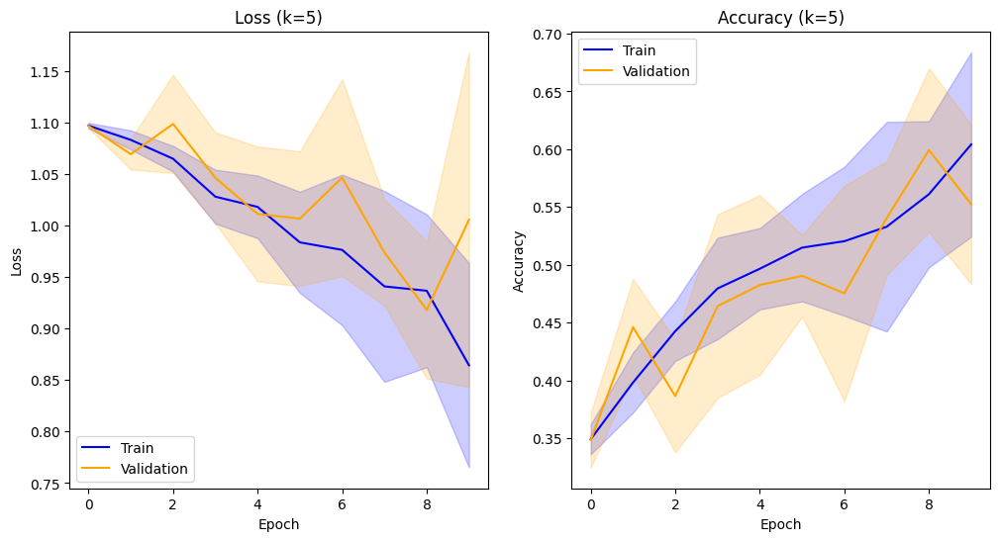

Précision : moyenne=55.238% écart-type=6.889%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,950,295 (11.25 MB)

 Trainable params: 2,950,295 (11.25 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.5852 - loss: 0.8602
Epoch 1: val_loss improved from None to 0.73068, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 843s 526ms/step - accuracy: 0.6896 - loss: 0.7011 - val_accuracy: 0.7167 - val_loss: 0.7307
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8390 - loss: 0.4019
Epoch 2: val_loss did not improve from 0.73068
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 845s 528ms/step - accuracy: 0.8649 - loss: 0.3420 - val_accuracy: 0.7241 - val_loss: 0.9538
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9220 - loss: 0.2104
Epoch 3: val_loss did not improve from 0.73068
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 845s 528ms/step - accuracy: 0.9321 - loss: 0.1846 - val_accuracy: 0.7167 - val_loss: 1.2770
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.9562 - loss: 0.1246
Epoch 4: val_loss did not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


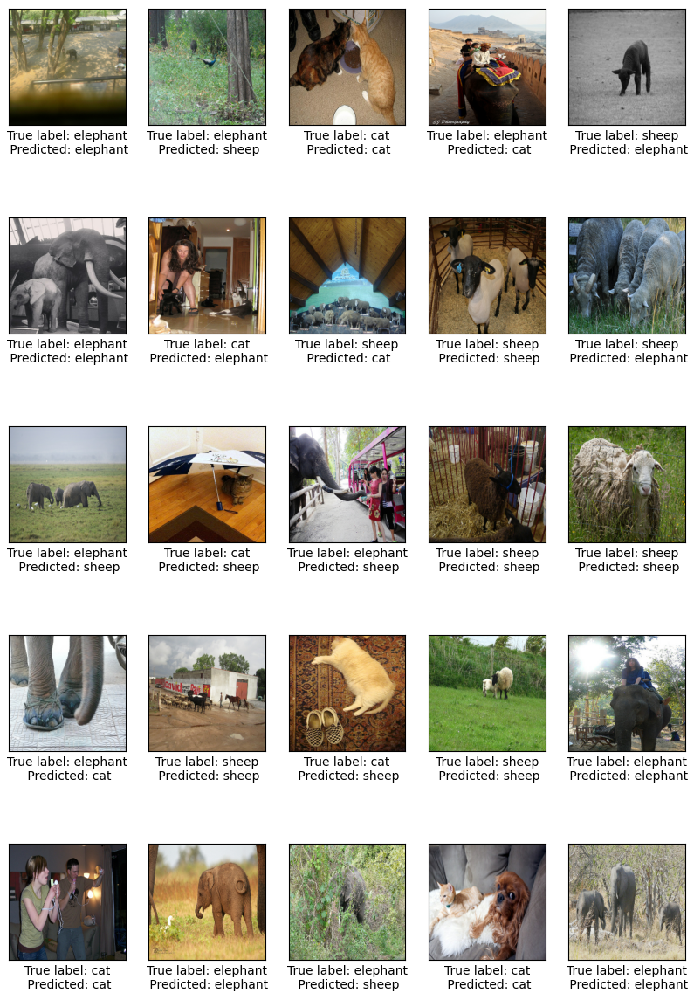

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step


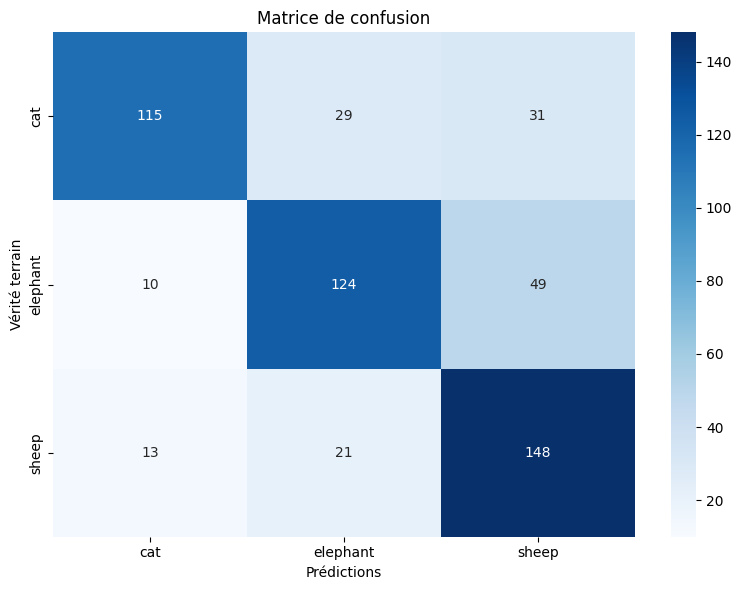

In [ ]:
matrice()

## 6 Conv 6 Denses

In [ ]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(5):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(6):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(3, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,839 (432.96 KB)

 Trainable params: 110,839 (432.96 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.3065 - loss: 1.0993 - val_accuracy: 0.3373 - val_loss: 1.0976
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - accuracy: 0.3363 - loss: 1.0998 - val_accuracy: 0.3690 - val_loss: 1.0971
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - accuracy: 0.3363 - loss: 1.0966 - val_accuracy: 0.5317 - val_loss: 1.0926
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - accuracy: 0.4067 - loss: 1.0923 - val_accuracy: 0.4881 - val_loss: 1.0832
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - accuracy: 0.4286 - loss: 1.0809 - val_accuracy: 0.5000 - val_loss: 1.0652
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - accuracy: 0.4306 - loss: 1.0574 - val_accuracy: 0.4405 - val_loss: 1.0692
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - accuracy: 0.4554 - loss: 1.0314 - val_accuracy: 0.4881 - val_loss: 1.0160
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - accuracy: 0.5069 - loss: 0.9669 - val_accurac

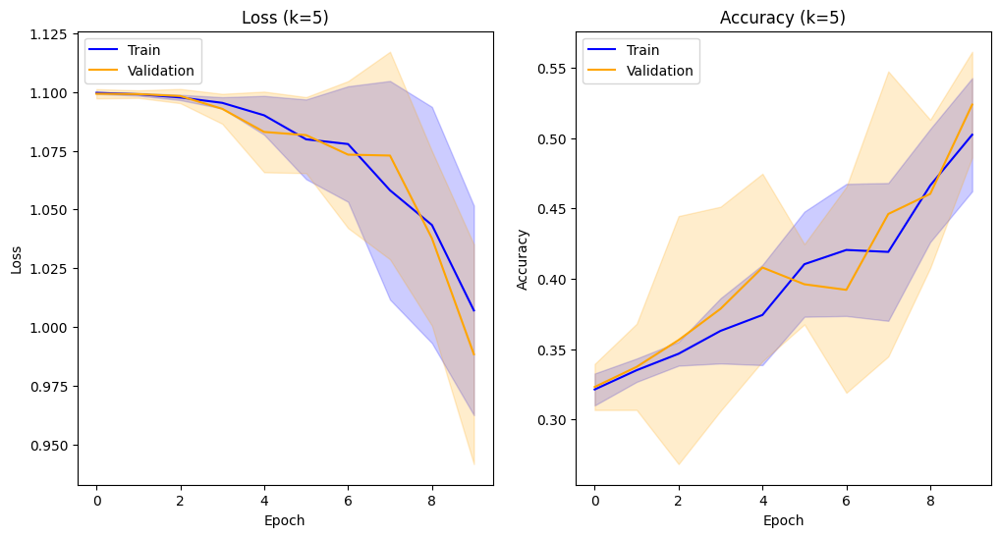

Précision : moyenne=52.381% écart-type=3.756%, k=5


In [ ]:
k=5
epochs=10
run_evaluation(k,epochs)

In [ ]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/sheep_cat_elephant_with_caption_600/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 1800 files belonging to 3 classes.
Using 1260 files for training.
Found 1800 files belonging to 3 classes.
Using 540 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,839 (432.96 KB)

 Trainable params: 110,839 (432.96 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 102400, nb image par batch : 64
Epoch 1/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.5052 - loss: 0.9637
Epoch 1: val_loss improved from None to 0.68113, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 794s 495ms/step - accuracy: 0.6174 - loss: 0.8229 - val_accuracy: 0.7389 - val_loss: 0.6811
Epoch 2/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.7657 - loss: 0.5753
Epoch 2: val_loss improved from 0.68113 to 0.68032, saving model to ./data/models\CNN_LV.keras
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 792s 495ms/step - accuracy: 0.7858 - loss: 0.5301 - val_accuracy: 0.7407 - val_loss: 0.6803
Epoch 3/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.8385 - loss: 0.4063
Epoch 3: val_loss did not improve from 0.68032
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 790s 494ms/step - accuracy: 0.8527 - loss: 0.3752 - val_accuracy: 0.7333 - val_loss: 0.9416
Epoch 4/5
1600/1600 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy:

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


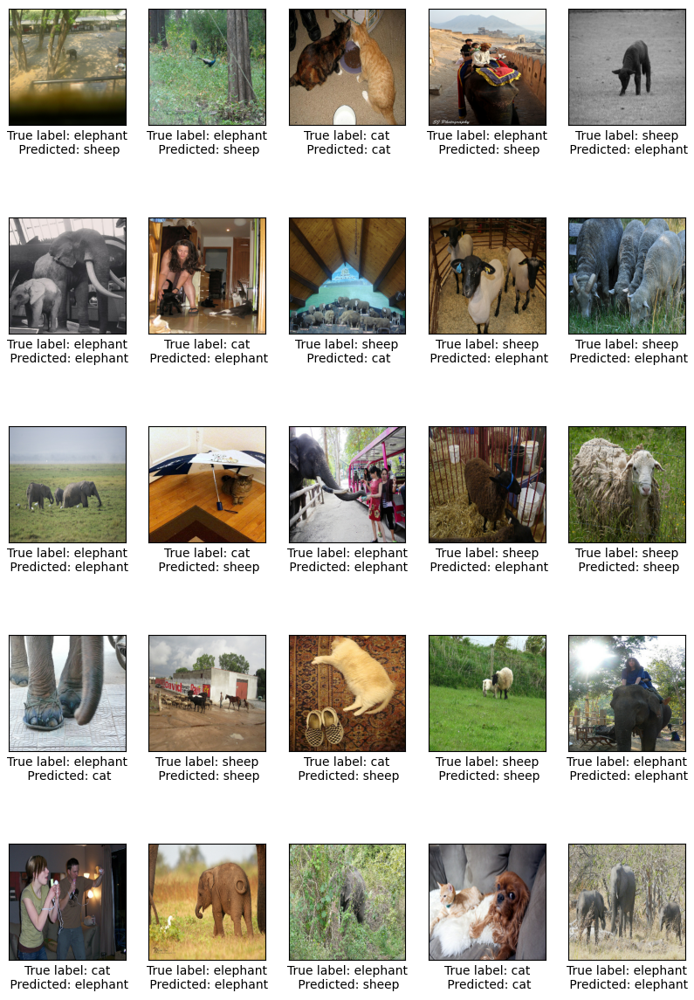

In [ ]:
tf.keras.backend.clear_session()
prediction()

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step


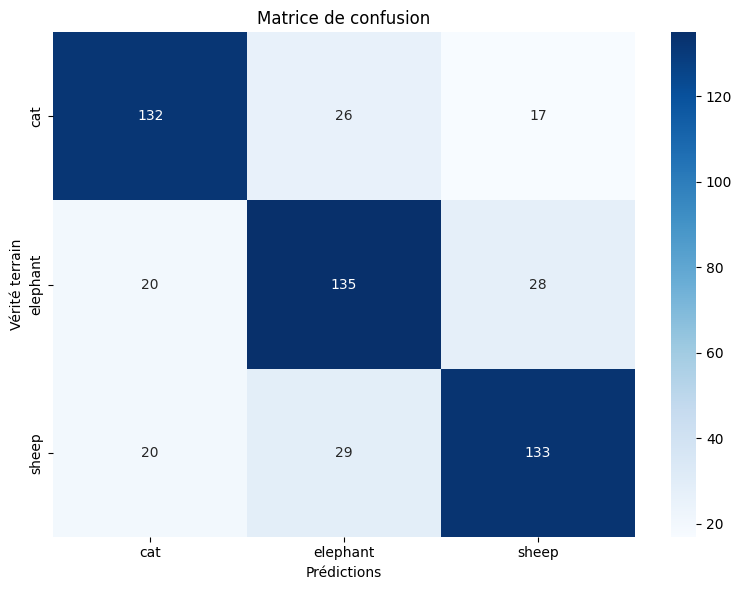

In [ ]:
matrice()

# Resultats

## 1 - 1
kfold (ectart-type: 4.639)
![image.png](attachment:image.png)

training

![image-2.png](attachment:image-2.png)

![image-3.png](attachment:image-3.png)

## 3-1
8.448
## 6-1
4.569
## 1-3
2.502
## 3-3
7.070
## 6-3
4.922
## 1-6
4.359
## 3-6
6.889
## 6-6
3.756
